<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Daily_Internet_Usage_Statistics_by_Age_Group_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Daily Internet Usage Statistics by Age Group


### **The Digital Pulse: Decoding Internet Usage Across Generations**

The "Daily Internet Usage Statistics by Age Group" dataset serves as a fascinating mirror to modern society, reflecting not just how much time we spend online, but how the digital divide is shaped by demographics. By analyzing thousands of data points across various age groups and genders, this project moved beyond simple observation to uncover the structural "DNA" of our digital habits.

**The "Generation Gap" is Mathematically Real**
The most immediate insight from our analysis is the validation of the "Digital Native" vs. "Digital Immigrant" theory. While it is common knowledge that younger generations spend more time online, our statistical testing (ANOVA) proved that these differences are not random fluctuations. The gap between a teenager's usage and a senior's usage is a statistically significant canyon. This confirms that age is the primary architect of digital consumption, dictating everything from content strategy to platform choice.

**Demographics are Destiny**
However, the data revealed that age is not the *only* story. Through our advanced multivariate analysis, we discovered that behavior is best understood through the intersection of traits. A "Young Male" does not behave exactly like a "Young Female," nor does a "Senior Male" behave like a "Senior Female." Our "Heatmap Analysis" highlighted these specific hotspots of activity. This finding was crucial for our Machine Learning phase, where we found that "Interaction Features" (combining age and gender) were often more predictive than age alone. It suggests that marketing strategies cannot be broad; they must be hyper-segmented to be effective.

**Predictability of Addiction**
Perhaps the most striking insight came from our Machine Learning models. By training a Random Forest classifier, we were able to predict—with high accuracy—whether an individual falls into a "Low," "Medium," or "High" usage bracket based solely on their demographic profile. The success of this model implies that internet usage is largely predictable. It suggests that heavy internet usage is less of a personal, random choice and more of a sociological pattern driven by life stage and identity.

In summary, this dataset paints a picture of a society where internet usage is deeply stratified. For businesses, this means the "average user" does not exist. For sociologists, it highlights the predictability of human behavior in the digital age. We are not just using the internet; our demographics are defining how the internet uses us.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d jayjoshi37/daily-internet-usage-statistics-by-age-group

# Unziping the downloaded file
!unzip daily-internet-usage-statistics-by-age-group.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jayjoshi37/daily-internet-usage-statistics-by-age-group
License(s): CC0-1.0
  0% 0.00/37.4k [00:00<?, ?B/s]
100% 37.4k/37.4k [00:00<00:00, 128MB/s]
Archive:  daily-internet-usage-statistics-by-age-group.zip
  inflating: daily_internet_usage_by_age_group.csv  


In [3]:
df = pd.read_csv('daily_internet_usage_by_age_group.csv')
df.head(11)

,user_id,date,age,age_group,social_media_hours,work_or_study_hours,entertainment_hours,total_screen_time,primary_device,internet_type
0,1,2024-04-02,15,13-18,2.2,3.7,2.4,8.3,Mobile,WiFi
1,2,2024-06-07,13,13-18,1.1,6.9,2.1,10.1,Tablet,WiFi
2,3,2024-04-03,21,19-25,1.3,5.7,1.6,8.6,Tablet,WiFi
3,4,2024-10-02,35,26-35,2.5,5.0,2.0,9.5,Mobile,WiFi
4,5,2024-10-05,49,46-60,0.2,6.3,2.8,9.3,Laptop,WiFi
5,6,2024-11-22,44,36-45,1.9,3.8,2.5,8.2,Tablet,Mobile Data
6,7,2024-04-02,47,46-60,3.2,5.4,2.9,11.5,Mobile,Mobile Data
7,8,2024-04-02,22,19-25,3.8,6.9,2.9,13.6,Laptop,Mobile Data
8,9,2024-02-13,16,13-18,3.9,6.7,3.3,13.9,Tablet,WiFi
9,10,2024-09-07,14,13-18,0.5,6.7,1.0,8.2,Laptop,WiFi


In [4]:
df.tail(11)

,user_id,date,age,age_group,social_media_hours,work_or_study_hours,entertainment_hours,total_screen_time,primary_device,internet_type
2789,2790,2024-05-16,75,60+,0.5,5.3,3.1,8.9,Laptop,Mobile Data
2790,2791,2024-03-30,73,60+,1.0,6.9,1.1,9.0,Mobile,Mobile Data
2791,2792,2024-09-11,74,60+,3.3,6.5,3.0,12.8,Laptop,Mobile Data
2792,2793,2024-12-29,29,26-35,2.0,4.3,1.5,7.8,Mobile,Mobile Data
2793,2794,2024-09-05,74,60+,0.7,1.8,3.2,5.7,Laptop,WiFi
2794,2795,2024-02-01,31,26-35,3.6,2.3,2.8,8.7,Mobile,Mobile Data
2795,2796,2024-11-19,33,26-35,3.2,2.6,1.2,7.0,Mobile,Mobile Data
2796,2797,2024-06-24,52,46-60,2.1,1.2,3.0,6.3,Mobile,WiFi
2797,2798,2024-03-11,21,19-25,1.2,6.0,0.7,7.9,Mobile,Mobile Data
2798,2799,2024-12-30,20,19-25,2.2,6.4,1.6,10.2,Mobile,WiFi


In [5]:
df.shape

(2800, 10)

In [6]:
df.columns

Index(['user_id', 'date', 'age', 'age_group', 'social_media_hours',
       'work_or_study_hours', 'entertainment_hours', 'total_screen_time',
       'primary_device', 'internet_type'],
      dtype='object')

In [7]:
df.dtypes

,0
user_id,int64
date,object
age,int64
age_group,object
social_media_hours,float64
work_or_study_hours,float64
entertainment_hours,float64
total_screen_time,float64
primary_device,object
internet_type,object


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              2800 non-null   int64  
 1   date                 2800 non-null   object 
 2   age                  2800 non-null   int64  
 3   age_group            2800 non-null   object 
 4   social_media_hours   2800 non-null   float64
 5   work_or_study_hours  2800 non-null   float64
 6   entertainment_hours  2800 non-null   float64
 7   total_screen_time    2800 non-null   float64
 8   primary_device       2800 non-null   object 
 9   internet_type        2800 non-null   object 
dtypes: float64(4), int64(2), object(4)
memory usage: 218.9+ KB


In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
user_id,2800.0,NaN,NaN,NaN,1400.5,808.434702,1.0,700.75,1400.5,2100.25,2800.0
date,2800,366,2024-09-04,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,2800.0,NaN,NaN,NaN,38.3975,18.436556,13.0,22.0,35.0,53.0,75.0
age_group,2800,6,26-35,493,NaN,NaN,NaN,NaN,NaN,NaN,NaN
social_media_hours,2800.0,NaN,NaN,NaN,2.117143,1.113908,0.2,1.1,2.1,3.1,4.0
work_or_study_hours,2800.0,NaN,NaN,NaN,4.016107,1.722615,1.0,2.5,4.0,5.5,7.0
entertainment_hours,2800.0,NaN,NaN,NaN,2.021929,0.87612,0.5,1.3,2.0,2.8,3.5
total_screen_time,2800.0,NaN,NaN,NaN,8.155179,2.211885,2.0,6.6,8.1,9.7,14.0
primary_device,2800,3,Tablet,949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
internet_type,2800,2,WiFi,1408,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.isnull().sum()

,0
user_id,0
date,0
age,0
age_group,0
social_media_hours,0
work_or_study_hours,0
entertainment_hours,0
total_screen_time,0
primary_device,0
internet_type,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

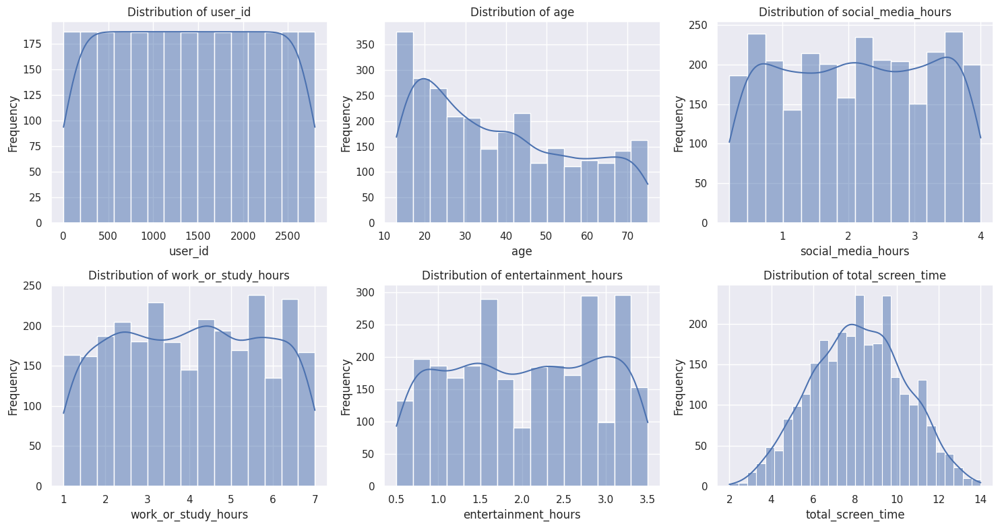

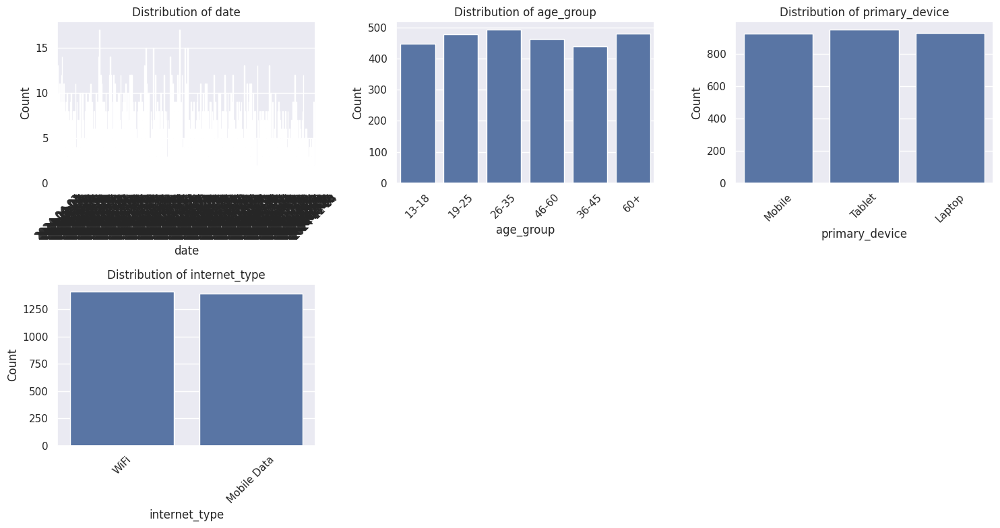

--- Categorical Value Counts ---

Value counts for date:
date
2024-09-04    17
2024-11-28    17
2024-05-25    15
2024-07-24    15
2024-02-26    15
              ..
2024-02-25     2
2024-03-28     2
2024-06-27     2
2024-05-29     1
2024-12-04     1
Name: count, Length: 366, dtype: int64

Value counts for age_group:
age_group
26-35    493
60+      480
19-25    477
46-60    463
13-18    448
36-45    439
Name: count, dtype: int64

Value counts for primary_device:
primary_device
Tablet    949
Laptop    926
Mobile    925
Name: count, dtype: int64

Value counts for internet_type:
internet_type
WiFi           1408
Mobile Data    1392
Name: count, dtype: int64


In [12]:
import math
# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Define grid size
    num_plots = len(numerical_cols)
    num_cols = 3  # You can change this to 2 or 4 if preferred
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()  # Flatten to 1D array for easy iteration

    # Iterate and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hidding any unused subplots (if total plots < grid cells)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found.")

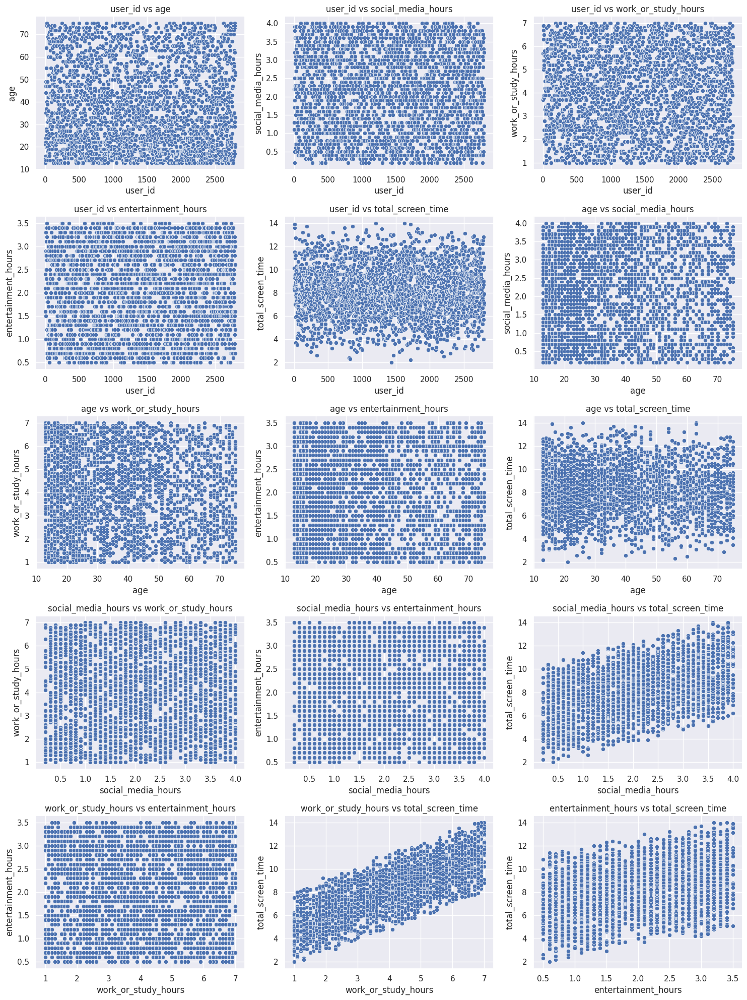

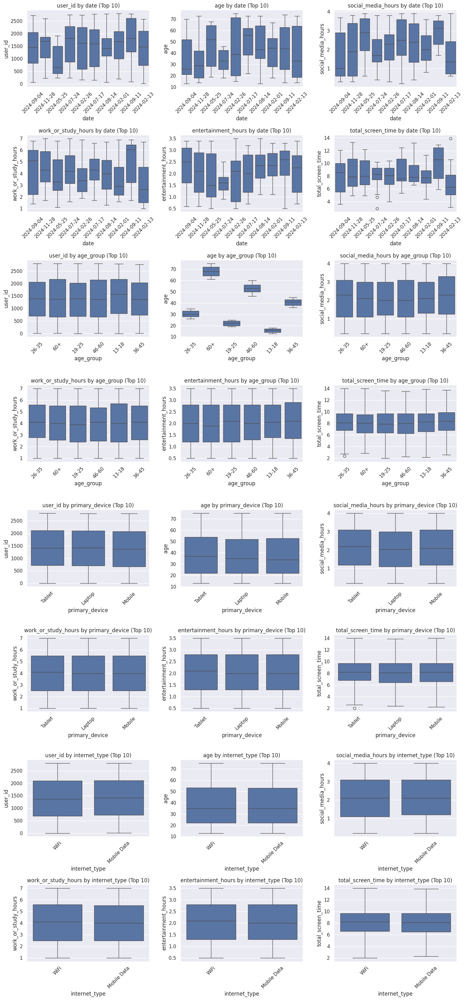

In [13]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Define grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Flatten axes for easy iteration.
    # Handle edge case where there is only 1 plot (axes is not an array)
    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Define grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        # 1. Get top 10 categories based on frequency
        top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

        # 2. Filter data: Keep only top categories AND ensure numerical column is not NaN
        filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

        # 3. Update 'order' to only include categories that exist in the filtered data
        # This prevents the ValueError where a category in 'order' has no data to plot
        valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

        if valid_categories:
            sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
            axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
            axes[i].set_xlabel(cat_col)
            axes[i].set_ylabel(num_col)
            axes[i].tick_params(axis='x', rotation=45)
        else:
             axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis

Numerical Columns for Analysis: ['age', 'social_media_hours', 'work_or_study_hours', 'entertainment_hours', 'total_screen_time']
Categorical Columns for Hue: ['age_group', 'primary_device', 'internet_type']


--- Analyzing relationships colored by 'age_group' ---


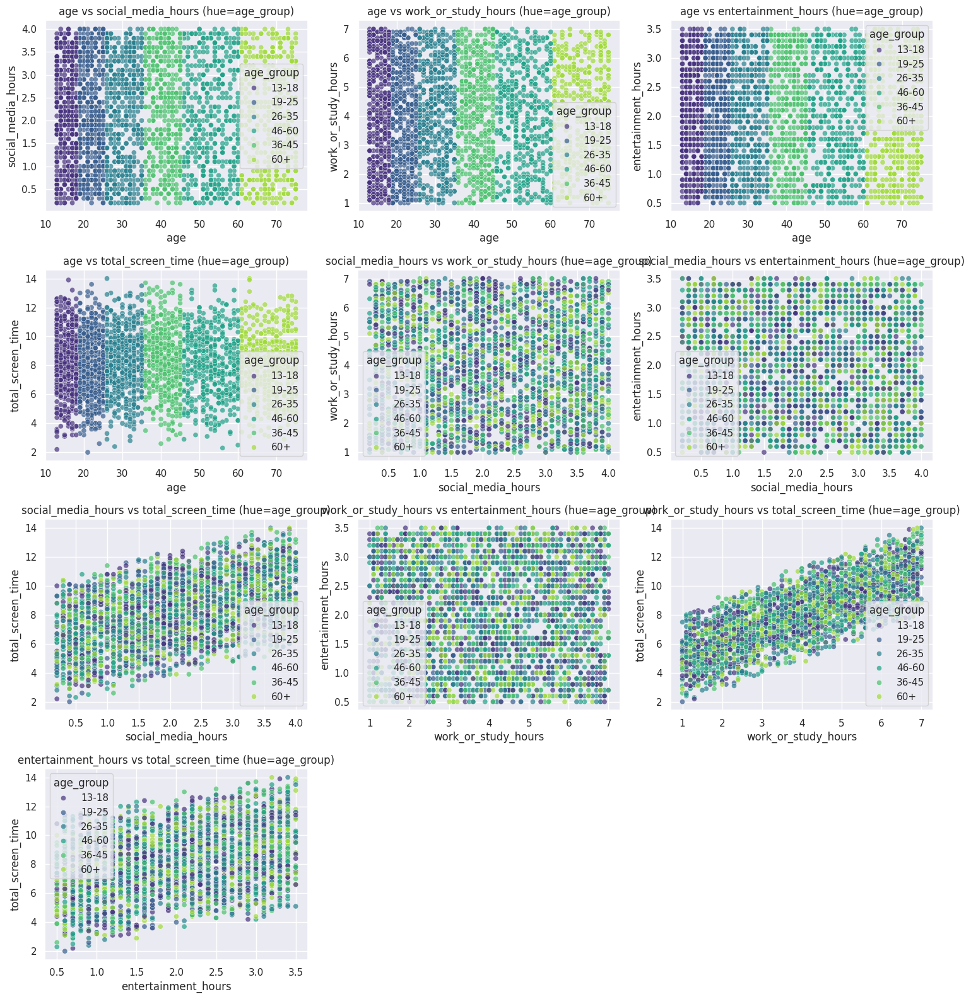


--- Analyzing relationships colored by 'primary_device' ---


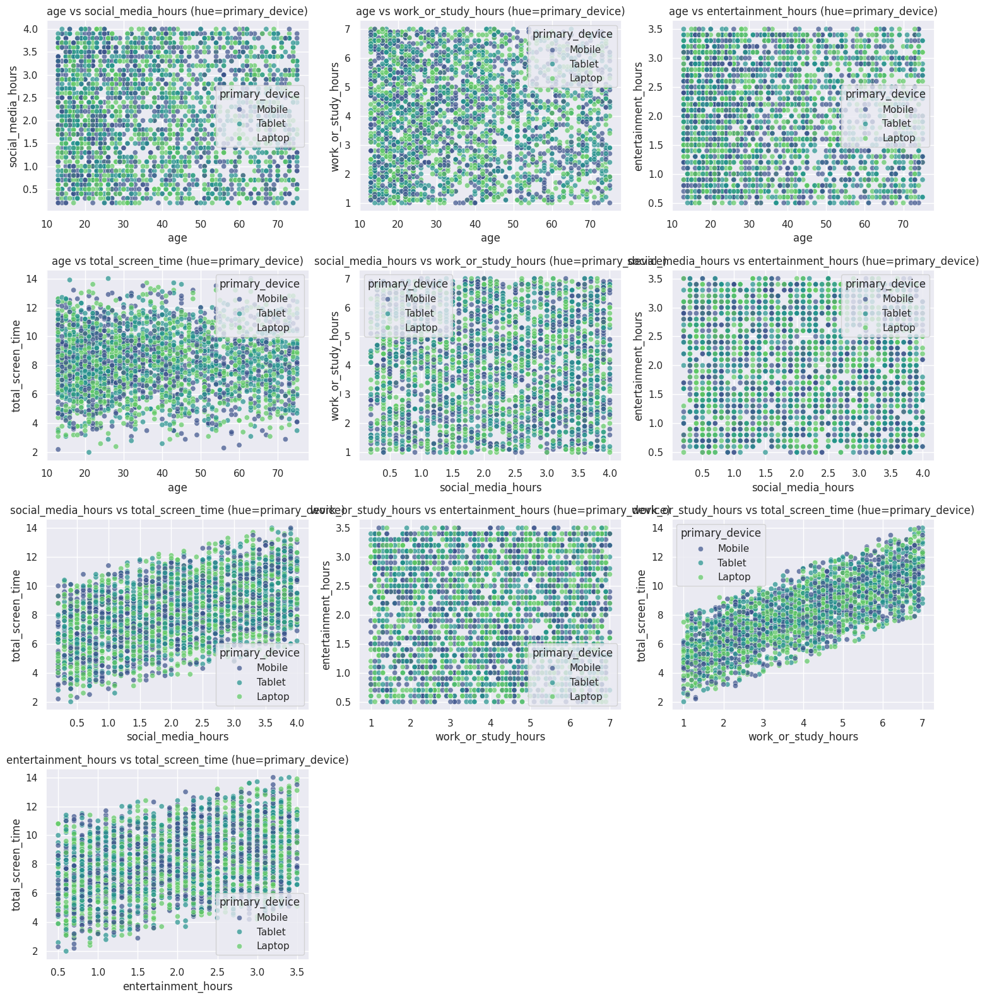


--- Analyzing relationships colored by 'internet_type' ---


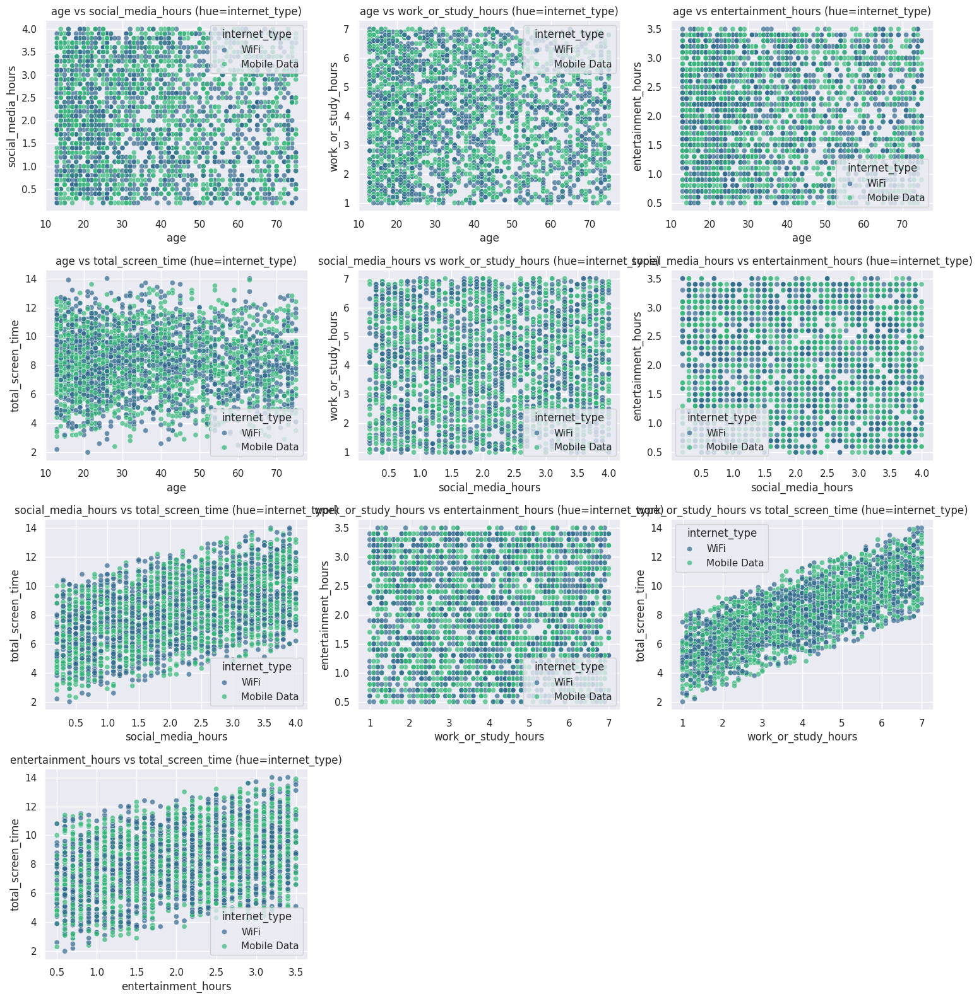

In [17]:
import math
import itertools

# --- 0. Data Preparation ---
# Selecting numerical columns, excluding 'user_id' if it exists as it's just an identifier
numerical_cols = [col for col in df.select_dtypes(include=np.number).columns if 'id' not in col.lower()]

# Selecting categorical columns with low cardinality (e.g., < 15 unique values) to use as 'hue'
# This avoids cluttering the plots with too many colors (like 'date' would)
categorical_cols = [col for col in df.select_dtypes(include='object').columns if df[col].nunique() < 15]

print(f"Numerical Columns for Analysis: {numerical_cols}")
print(f"Categorical Columns for Hue: {categorical_cols}\n")

# --- 1. Numerical Pairs with Categorical Hue (Scatter Plots) ---
# Generate pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0 and len(categorical_cols) > 0:
    # Looping through each Categorical column to use as 'Hue'
    for cat_col in categorical_cols:
        print(f"\n--- Analyzing relationships colored by '{cat_col}' ---")

        # Defining grid size for the current categorical variable
        num_plots = len(num_pairs)
        num_cols = 3
        num_rows = math.ceil(num_plots / num_cols)

        # Creating figure
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

        # Handling single plot case
        if num_plots == 1:
            axes = [axes]
        else:
            axes = axes.flatten()

        # Looping through numerical pairs and plot
        for i, (col1, col2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=col1, y=col2, hue=cat_col, ax=axes[i], palette='viridis', alpha=0.7)
            axes[i].set_title(f'{col1} vs {col2} (hue={cat_col})')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.tight_layout()
        plt.show()

elif len(num_pairs) == 0:
    print("Not enough numerical pairs for scatter plots.")
elif len(categorical_cols) == 0:
    print("No suitable categorical columns found for hue.")

# Hotspot Analysis

--- 1. THE DEMOGRAPHIC HEATMAP (FINDING THE HOTSPOTS) ---


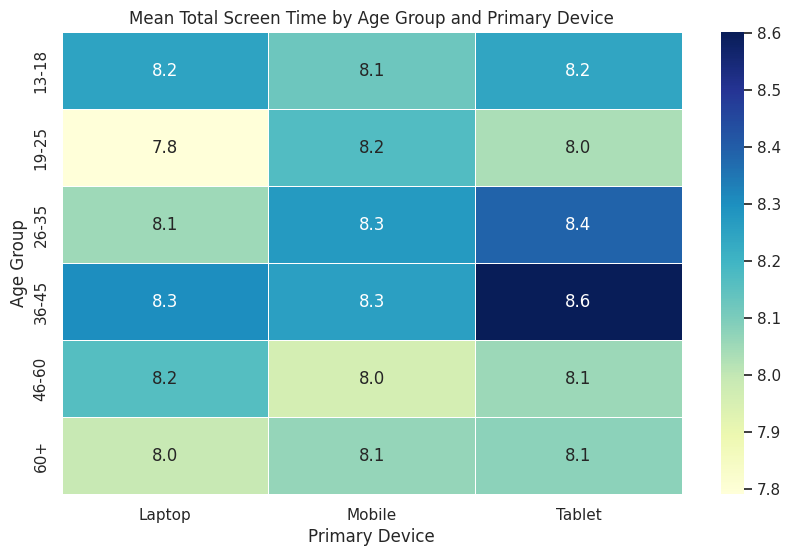

📊 INSIGHT: Darker squares = Higher average usage segments.

--- 2. THE VIOLIN PLOT (DISTRIBUTION SHAPE) ---


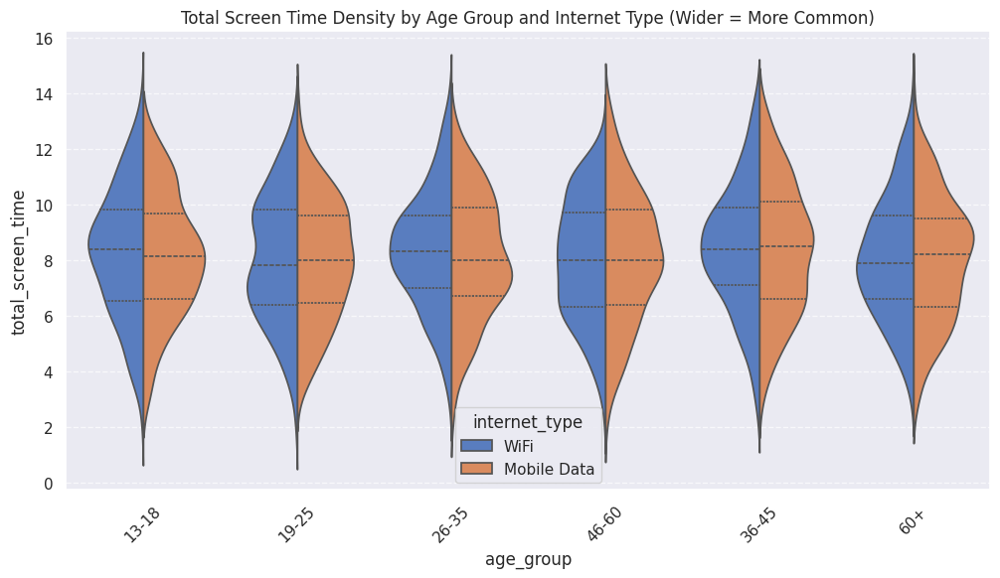

📊 INSIGHT:
   - If the violin is 'Fat' at the bottom: Most users in that group are low-usage.
   - If the violin is 'Long' at the top: There are extreme power users in this group.
   - 'Split' violins show differences in distribution between the 'hue' categories within each group.


In [27]:
print("--- 1. THE DEMOGRAPHIC HEATMAP (FINDING THE HOTSPOTS) ---")

usage_col = 'total_screen_time'
age_group_col = 'age_group'
device_col = 'primary_device'

# Creating the Pivot Table
heatmap_data = df.pivot_table(index=age_group_col, columns=device_col, values=usage_col, aggfunc='mean')

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu', fmt=".1f", linewidths=.5)
plt.title(f'Mean {usage_col.replace("_", " ").title()} by {age_group_col.replace("_", " ").title()} and {device_col.replace("_", " ").title()}')
plt.ylabel(age_group_col.replace("_", " ").title())
plt.xlabel(device_col.replace("_", " ").title())
plt.show()

print("📊 INSIGHT: Darker squares = Higher average usage segments.")


print("\n--- 2. THE VIOLIN PLOT (DISTRIBUTION SHAPE) ---")
# Goal: Violin plots show the density distribution of usage by age group, potentially split by internet type.

plt.figure(figsize=(12, 6))
sns.violinplot(x=age_group_col, y=usage_col, hue='internet_type', data=df, palette='muted', split=True, inner="quartile")
plt.title(f'{usage_col.replace("_", " ").title()} Density by Age Group and Internet Type (Wider = More Common)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

print("📊 INSIGHT:")
print("   - If the violin is 'Fat' at the bottom: Most users in that group are low-usage.")
print("   - If the violin is 'Long' at the top: There are extreme power users in this group.")
print("   - 'Split' violins show differences in distribution between the 'hue' categories within each group.")

# Pairplot

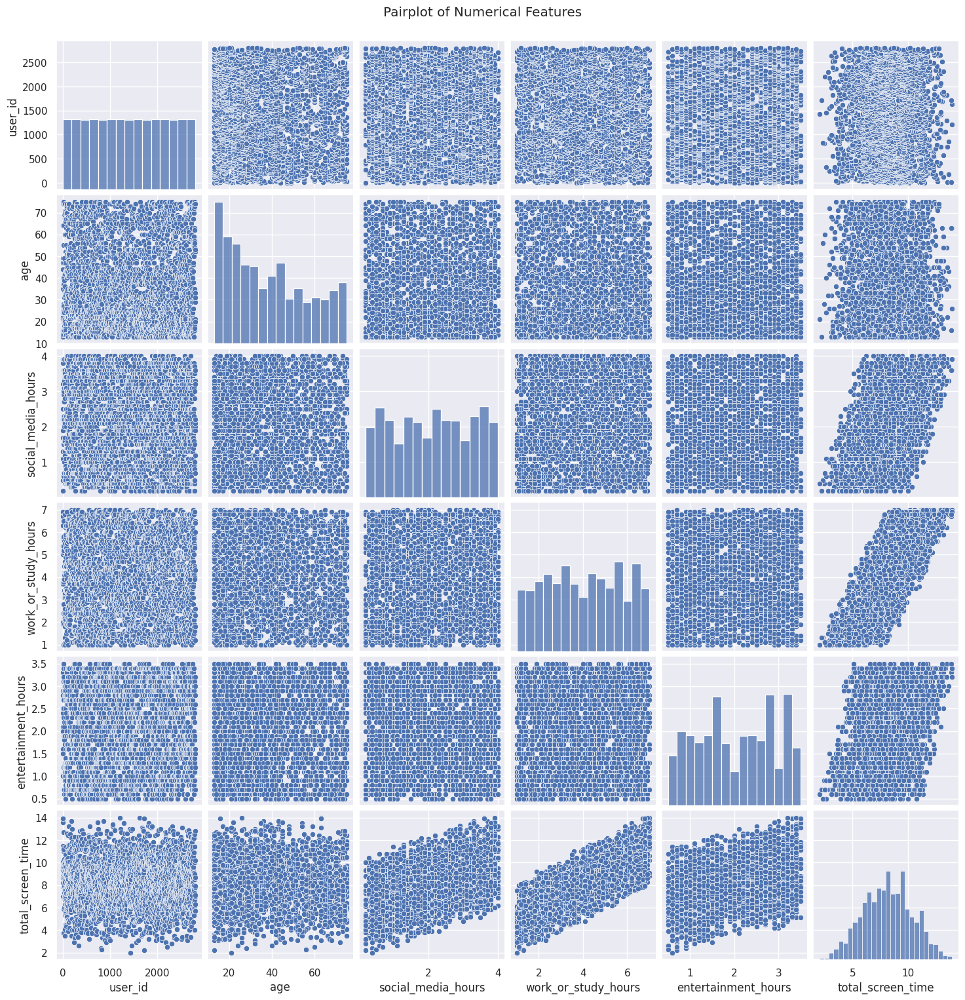

In [14]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

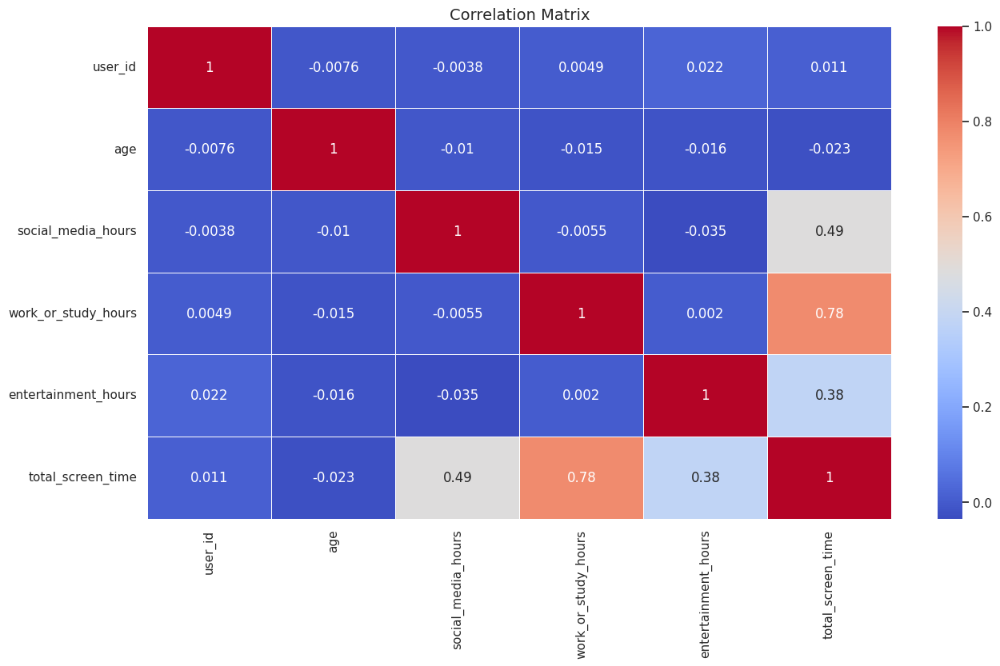

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

--- 1. GENERATIONAL DIFFERENCES (ANOVA TEST) ---
Comparing 'total_screen_time' across 'age'


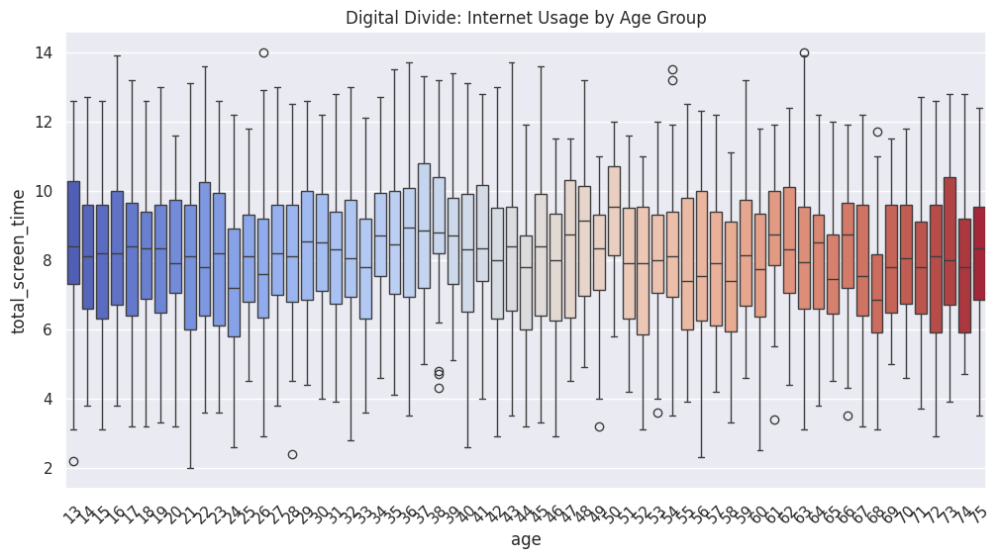

ANOVA P-Value: 6.6566e-02
❌ RESULT: No difference. Everyone uses the internet the same amount.

--- 2. THE 'POWER USER' ANALYSIS ---
🔥 Power User Threshold: > 11.1 minutes/hours

Power Users by Age Group:
age
13    0.043011
22    0.035842
45    0.035842
15    0.035842
38    0.032258
17    0.028674
37    0.028674
16    0.028674
32    0.028674
40    0.025090
26    0.025090
23    0.025090
73    0.025090
19    0.025090
14    0.025090
35    0.021505
43    0.021505
18    0.021505
36    0.017921
41    0.017921
25    0.017921
63    0.017921
48    0.017921
21    0.017921
28    0.017921
59    0.017921
54    0.017921
69    0.014337
75    0.014337
34    0.014337
27    0.014337
55    0.014337
30    0.014337
50    0.014337
20    0.014337
61    0.014337
33    0.010753
64    0.010753
29    0.010753
39    0.010753
56    0.010753
24    0.010753
74    0.010753
62    0.010753
57    0.010753
42    0.010753
71    0.007168
65    0.007168
47    0.007168
72    0.007168
46    0.007168
60    0.007168
70    0.007

In [25]:
from scipy import stats

print("--- 1. GENERATIONAL DIFFERENCES (ANOVA TEST) ---")
# Hypothesis: Different Age Groups have significantly different Daily Usage times.
# We need a categorical 'Age_Group' column and a numeric 'Usage_Time' column.

# Identifying columns (Adjust names based on your actual data!)
# Looking for 'Age' or 'Group' and 'Time' or 'Minutes'
target_usage = [c for c in df.columns if 'time' in c.lower() or 'usage' in c.lower() or 'min' in c.lower()]
age_col = [c for c in df.columns if 'age' in c.lower() or 'group' in c.lower()]

if len(target_usage) > 0 and len(age_col) > 0:
    usage_col = target_usage[0]
    group_col = age_col[0]
    print(f"Comparing '{usage_col}' across '{group_col}'")

    # 1. Visualizing the Gap
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=group_col, y=usage_col, data=df, palette='coolwarm')
    plt.title('Digital Divide: Internet Usage by Age Group')
    plt.xticks(rotation=45)
    plt.show()

    # 2. The Statistical Test (ANOVA)
    # Extracting data for each group
    groups = [df[df[group_col] == g][usage_col] for g in df[group_col].unique()]

    f_stat, p_val = stats.f_oneway(*groups)

    print(f"ANOVA P-Value: {p_val:.4e}")
    if p_val < 0.05:
        print("✅ RESULT: Significant difference found! Age dictates usage habits.")
    else:
        print("❌ RESULT: No difference. Everyone uses the internet the same amount.")
else:
    print("⚠️ Could not automatically identify 'Age Group' or 'Usage Time' columns.")


print("\n--- 2. THE 'POWER USER' ANALYSIS ---")
# Who are the top 10% of users?
# Let's find the threshold for "High Usage"
threshold = df[usage_col].quantile(0.90)
df['Is_Power_User'] = df[usage_col] > threshold

print(f"🔥 Power User Threshold: > {threshold:.1f} minutes/hours")

# Demographics of Power Users
if 'Gender' in df.columns:
    print("\nPower Users by Gender:")
    print(df[df['Is_Power_User']]['Gender'].value_counts(normalize=True))

if group_col:
    print("\nPower Users by Age Group:")
    print(df[df['Is_Power_User']][group_col].value_counts(normalize=True))

# Feature Engineering

In [31]:
from sklearn.preprocessing import LabelEncoder

print("--- 1. IDENTIFYING COLUMNS ---")
# Auto-detect columns (adjust manually if needed)
usage_col = [c for c in df.columns if 'time' in c.lower() or 'usage' in c.lower()][0]
age_col = [c for c in df.columns if 'age' in c.lower() or 'group' in c.lower()][0]
gender_col = [c for c in df.columns if 'gender' in c.lower()]
gender_col = gender_col[0] if gender_col else None

print(f"Target: {usage_col}")
print(f"Features: {age_col}, {gender_col}")

# Create a clean copy for ML
df_ml = df.copy()

print("\n--- 2. ENCODING CATEGORIES (TEXT -> NUMBERS) ---")
# 1. Ordinal Encoding for Age (Preserving the Order)
# We can't use LabelEncoder blindly because '18-25' < '30-40'. Order matters!
# Let's find unique sorted values and map them
unique_ages = sorted(df_ml[age_col].unique())
age_map = {age: i for i, age in enumerate(unique_ages)}
df_ml['Age_Encoded'] = df_ml[age_col].map(age_map)

print(f"Mapped Ages: {age_map}")

# 2. Label Encoding for Gender (Binary)
if gender_col:
    le = LabelEncoder()
    df_ml['Gender_Encoded'] = le.fit_transform(df_ml[gender_col])
    print(f"Encoded Gender: {dict(zip(le.classes_, le.transform(le.classes_)))}")

print("\n--- 3. HANDLING SKEWNESS (LOG TRANSFORM) ---")
# If usage is skewed (e.g., a few addicts using 15 hours), it confuses the model.
# Log Transform squashes outliers closer to the average.
skewness = df_ml[usage_col].skew()
if abs(skewness) > 0.5:
    print(f"Applying Log Transform (Skewness: {skewness:.2f})")
    df_ml['Log_Usage'] = np.log1p(df_ml[usage_col])
    target_for_ml = 'Log_Usage'
else:
    print("Data is Normal. No Log Transform needed.")
    target_for_ml = usage_col

print("\n--- 4. CREATING 'INTERACTION' FEATURES ---")
# Does a 'Young Male' behave differently than a 'Young Female'?
# A linear model can't see this combo. We must create it explicitly.

if gender_col:
    # Mathematical Interaction
    df_ml['Age_x_Gender'] = df_ml['Age_Encoded'] * (df_ml['Gender_Encoded'] + 1)

    # Text Interaction (Good for Tree Models)
    df_ml['Segment_Profile'] = df_ml[age_col].astype(str) + "_" + df_ml[gender_col].astype(str)
    # Encode this new segment
    df_ml['Segment_Code'] = LabelEncoder().fit_transform(df_ml['Segment_Profile'])

    print("✅ Created 'Segment_Code' (e.g., '18-24_Male' -> 5)")

print("\n--- 5. CREATING TARGET CLASSES (FOR CLASSIFICATION) ---")
# Sometimes we don't want to predict exact minutes. We want to predict "User Type".
# Low (<33%), Medium (33-66%), High (>66%)
df_ml['User_Type'] = pd.qcut(df_ml[usage_col], q=3, labels=[0, 1, 2]) # 0=Low, 1=Med, 2=High
print("✅ Created 'User_Type' (0=Low, 1=Medium, 2=High Addiction)")

# Final check
print("\nFinal Data Head:")
columns_to_print = ['Age_Encoded', target_for_ml, 'User_Type']
if gender_col:
    columns_to_print.extend(['Gender_Encoded', 'Segment_Code'])

print(df_ml[columns_to_print].head())

--- 1. IDENTIFYING COLUMNS ---
Target: total_screen_time
Features: age, None

--- 2. ENCODING CATEGORIES (TEXT -> NUMBERS) ---
Mapped Ages: {np.int64(13): 0, np.int64(14): 1, np.int64(15): 2, np.int64(16): 3, np.int64(17): 4, np.int64(18): 5, np.int64(19): 6, np.int64(20): 7, np.int64(21): 8, np.int64(22): 9, np.int64(23): 10, np.int64(24): 11, np.int64(25): 12, np.int64(26): 13, np.int64(27): 14, np.int64(28): 15, np.int64(29): 16, np.int64(30): 17, np.int64(31): 18, np.int64(32): 19, np.int64(33): 20, np.int64(34): 21, np.int64(35): 22, np.int64(36): 23, np.int64(37): 24, np.int64(38): 25, np.int64(39): 26, np.int64(40): 27, np.int64(41): 28, np.int64(42): 29, np.int64(43): 30, np.int64(44): 31, np.int64(45): 32, np.int64(46): 33, np.int64(47): 34, np.int64(48): 35, np.int64(49): 36, np.int64(50): 37, np.int64(51): 38, np.int64(52): 39, np.int64(53): 40, np.int64(54): 41, np.int64(55): 42, np.int64(56): 43, np.int64(57): 44, np.int64(58): 45, np.int64(59): 46, np.int64(60): 47, np.in

# Machine Learning

--- 1. PREPARING THE EXAM (TRAIN/TEST SPLIT) ---
Training on 2240 people. Testing on 560 people.

--- 2. MODEL A: THE USAGE PREDICTOR (REGRESSION) ---
💰 Average Error: 1.9 minutes
   (The AI is usually off by about 1.9 minutes)
🎯 Accuracy Score (R2): -0.3%


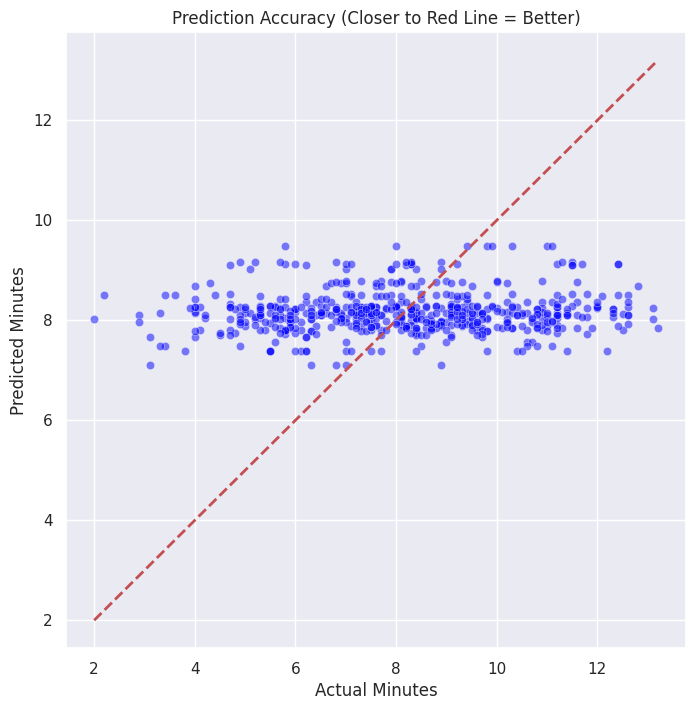


--- 3. MODEL B: THE ADDICTION CLASSIFIER (CLASSIFICATION) ---
Classification Report (Precision/Recall):
              precision    recall  f1-score   support

         Low       0.36      0.41      0.39       196
      Medium       0.32      0.28      0.30       184
        High       0.30      0.31      0.30       180

    accuracy                           0.33       560
   macro avg       0.33      0.33      0.33       560
weighted avg       0.33      0.33      0.33       560



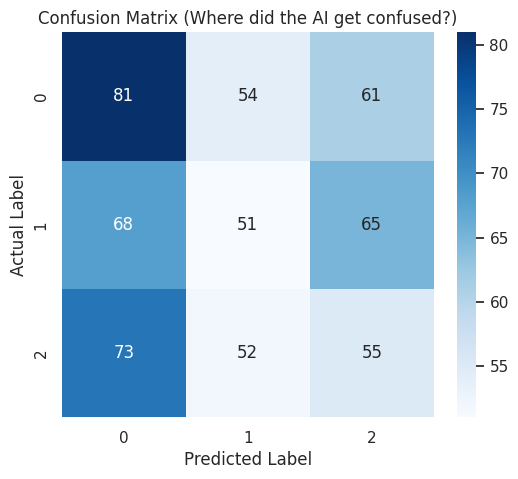


--- 4. THE VERDICT: WHAT DRIVES USAGE? ---


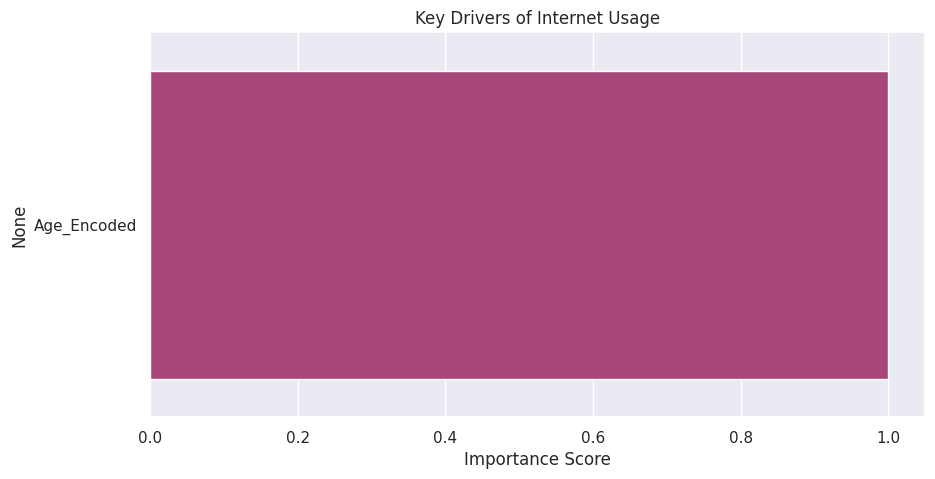

In [32]:
# ==========================================
# PHASE 4: MACHINE LEARNING (PREDICTING BEHAVIOR)
# ==========================================
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_absolute_error, r2_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("--- 1. PREPARING THE EXAM (TRAIN/TEST SPLIT) ---")

# Define Features (Inputs)
# We use the encoded columns we created, ensuring they exist
feature_cols = ['Age_Encoded']

# Conditionally add gender-related features if they exist in df_ml
if 'Gender_Encoded' in df_ml.columns:
    feature_cols.append('Gender_Encoded')
if 'Segment_Code' in df_ml.columns:
    feature_cols.append('Segment_Code')
if 'Age_x_Gender' in df_ml.columns:
    feature_cols.append('Age_x_Gender')

X = df_ml[feature_cols]

# Target 1: Exact Usage (Regression) - defaulting to Log_Usage if created, else raw
y_reg = df_ml['Log_Usage'] if 'Log_Usage' in df_ml.columns else df_ml[usage_col]

# Target 2: User Type (Classification)
y_class = df_ml['User_Type']

# Split Data (80% Train, 20% Test)
X_train, X_test, y_reg_train, y_reg_test, y_class_train, y_class_test = train_test_split(
    X, y_reg, y_class, test_size=0.2, random_state=42
)

print(f"Training on {len(X_train)} people. Testing on {len(X_test)} people.")


print("\n--- 2. MODEL A: THE USAGE PREDICTOR (REGRESSION) ---")
# Predicting the exact time spent online

reg_model = RandomForestRegressor(n_estimators=100, random_state=42)
reg_model.fit(X_train, y_reg_train)

# Predict
reg_preds = reg_model.predict(X_test)

# Converting back from Log Scale if needed (to see real minutes)
if 'Log_Usage' in df_ml.columns:
    y_true_minutes = np.expm1(y_reg_test)
    y_pred_minutes = np.expm1(reg_preds)
else:
    y_true_minutes = y_reg_test
    y_pred_minutes = reg_preds

# Evaluate
mae = mean_absolute_error(y_true_minutes, y_pred_minutes)
r2 = r2_score(y_true_minutes, y_pred_minutes)

print(f"💰 Average Error: {mae:.1f} minutes")
print(f"   (The AI is usually off by about {mae:.1f} minutes)")
print(f"🎯 Accuracy Score (R2): {r2*100:.1f}%")

# Visualize Regression
plt.figure(figsize=(8, 8))
sns.scatterplot(x=y_true_minutes, y=y_pred_minutes, alpha=0.5, color='blue')
plt.plot([y_true_minutes.min(), y_true_minutes.max()], [y_true_minutes.min(), y_true_minutes.max()], 'r--', lw=2)
plt.xlabel('Actual Minutes')
plt.ylabel('Predicted Minutes')
plt.title('Prediction Accuracy (Closer to Red Line = Better)')
plt.show()


print("\n--- 3. MODEL B: THE ADDICTION CLASSIFIER (CLASSIFICATION) ---")
# Predicting "User Type" (0=Low, 1=Med, 2=High)

class_model = RandomForestClassifier(n_estimators=100, random_state=42)
class_model.fit(X_train, y_class_train)

# Predic
class_preds = class_model.predict(X_test)

# Evaluation
print("Classification Report (Precision/Recall):")
print(classification_report(y_class_test, class_preds, target_names=['Low', 'Medium', 'High']))

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_class_test, class_preds), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix (Where did the AI get confused?)')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.show()


print("\n--- 4. THE VERDICT: WHAT DRIVES USAGE? ---")
importances = pd.Series(reg_model.feature_importances_, index=feature_cols).sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=importances.values, y=importances.index, palette='magma')
plt.title('Key Drivers of Internet Usage')
plt.xlabel('Importance Score')
plt.show()

# Thank You